# Pulmonary Localization Using Convolutional Neural Networks - Inception Architecture
***

### 1. Importing and Installing Packages
***

In [ ]:
!pip install lungs-segmentation

In [1]:
from lungs_segmentation.pre_trained_models import create_model
from sklearn.model_selection import train_test_split
import lungs_segmentation.inference as inference
from bbox_delimiters import bbox_utils
import matplotlib.pyplot as plt
from google.colab import drive 
import urllib.request as url
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import glob
import time
import cv2
import torch

In [2]:
seg_model = bbox_utils().model_segmentation(architecture = 'resnet34')

### 2. Importing CheXpert Data
***

In [ ]:
drive.mount('/content/gdrive', force_remount = True)
!cp -r /content/gdrive/MyDrive/chexpert-v10-small.zip /content/
!unzip /content/chexpert-v10-small.zip
!rm /content/chexpert-v10-small.zip

### 3. Creating Training, Validation, and Testing Dataframes
***

In [27]:
train_data = pd.read_csv('/content/train-data.csv', delimiter = ',',
                         usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
test_data = pd.read_csv('/content/test-data.csv', delimiter = ',',
                        usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
val_data = pd.read_csv('/content/val-data.csv', delimiter = ',',
                       usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

print('Training Images: {} images'.format(len(train_data)))
print('Validation Images: {} images'.format(len(val_data)))
print('Test Images: {} images'.format(len(test_data)))

Training Images: 152808 images
Validation Images: 19051 images
Test Images: 19101 images


### 4. Preparing Data for the Network
***

In [28]:
def make_gen(dataframe):
  '''
  build an image generator from a dataframe

  Args:
    dataframe (dataframe) --> pandas pack data set

  Returns:
    gen (generator) --> keras data generator
  '''

  data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)
  gen = data_gen.flow_from_dataframe(dataframe = dataframe, directory = '', x_col = 'Path',
                                     y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                     target_size = (128, 128), color_mode ='rgb', batch_size = 128,
                                     class_mode='raw', shuffle = True, seed = 42)
  
  return gen

In [29]:
train_generator = make_gen(dataframe = train_data)
validation_generator = make_gen(dataframe = val_data)
test_generator = make_gen(dataframe = test_data)

Found 152808 validated image filenames.
Found 19051 validated image filenames.
Found 19101 validated image filenames.


### 5. Organizing the Network Architecture
***

In [ ]:
conv_base = tf.keras.applications.InceptionV3(input_shape = (128, 128, 3), include_top = False, weights = 'imagenet')

In [39]:
layers_name = list()
for layer in conv_base.layers:
  layers_name.append(layer.name)

block_names = ['input_1', 'activation_18', 'batch_normalization_30', 'conv2d_58', 'mixed8']

for blocks in block_names:
  try:
    layers_name.index(blocks)
    print('Bloco ' + blocks + ' found!')
  except ValueError:
    print('Bloco ' + blocks + ' not found!')

Bloco input_1 found!
Bloco activation_18 found!
Bloco batch_normalization_30 found!
Bloco conv2d_58 found!
Bloco mixed8 found!


In [40]:
inputs = tf.keras.Input(shape=(128, 128, 3))
feature_extractor = conv_base(inputs)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(units = 512, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 256, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 64, activation = tf.nn.relu)(x)

bounding_box_regression_output = tf.keras.layers.Dense(units = 4)(x)
model = tf.keras.models.Model(inputs = inputs, outputs = bounding_box_regression_output)

model.compile(optimizer=tf.keras.optimizers.SGD(momentum = 0.9), loss = 'mean_squared_error', metrics = ['acc'])

In [41]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [42]:
def freeze_layers(conv_base, layer_name):
  '''
  freeze layers of convolutional neural network training

  Args:
    conv_base (tensor) --> convolutional layers of the model
    layer_name (str) --> name of the freezing weight boundary layer
  '''

  conv_base.trainable = True
  set_trainable = False

  for layer in conv_base.layers:
    if layer.name == layer_name:
      set_trainable = True
    if set_trainable:
      layer.trainable = True
    else:
      layer.trainable = False
  
  return None

### 5. Organizing the Assessment Metric (IoU)
***

In [43]:
def intersection_over_union(pred_box, true_box, smoothing_factor = 1e-10):
  '''
  intersection metric on the Union of bounding boxes

  Args:
    pred_box (list) --> coordinates of predicted bounding boxes
    true_box (list) --> coordinates of the original bounding boxes

  Returns:
    iou (int) --> calculated IoU metric
  '''

  xmin_pred, ymin_pred, xmax_pred, ymax_pred =  pred_box
  xmin_true, ymin_true, xmax_true, ymax_true = true_box

  xmin_overlap = np.maximum(xmin_pred, xmin_true)
  xmax_overlap = np.minimum(xmax_pred, xmax_true)
  ymin_overlap = np.maximum(ymin_pred, ymin_true)
  ymax_overlap = np.minimum(ymax_pred, ymax_true)

  pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
  true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

  overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
  union_area = (pred_box_area + true_box_area) - overlap_area
    
  iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

  return iou

### 6. Getting Test Data
***

In [44]:
for i in range(0, len(test_generator)):
  x, y = test_generator[i]
  if i == 0:
    test_images, test_labels = x, y
  else:
    test_images, test_labels = np.concatenate((test_images, x)), np.concatenate((test_labels, y))

### 7. Model Training
***

In [45]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights.hdf5', monitor = 'val_acc', verbose = True, 
                                                save_best_only = True, save_weights_only = True, mode = 'max')
callbacks = [checkpoint]

In [46]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[4])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [52]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 276s 220ms/step - loss: 0.0063 - acc: 0.7105 - val_loss: 0.0031 - val_acc: 0.7638

Epoch 00001: val_acc improved from -inf to 0.76379, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 250s 207ms/step - loss: 0.0026 - acc: 0.7910 - val_loss: 0.0024 - val_acc: 0.7987

Epoch 00002: val_acc improved from 0.76379 to 0.79870, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 247s 205ms/step - loss: 0.0021 - acc: 0.8137 - val_loss: 0.0021 - val_acc: 0.8141

Epoch 00003: val_acc improved from 0.79870 to 0.81408, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 246s 204ms/step - loss: 0.0019 - acc: 0.8288 - val_loss: 0.0019 - val_acc: 0.8300

Epoch 00004: val_acc improved from 0.81408 to 0.83004, saving model to weights.hdf5


In [ ]:
model.save('model_inception1')
!zip -r model_inception1.zip /content/model_inception1
shutil.move('/content/model_inception1.zip', '/content/gdrive/MyDrive/lung-localization/inception/')

In [54]:
iou_mean_list = list()
iou_scores_list = list()
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('IoU Metric: {:.2f}%'.format(iou_mean_list[0] * 100))

IoU Metric: 84.98%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model1_inception.txt', scores)
shutil.move('/content/scores_model1_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

In [56]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[3])
 model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [57]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 267s 221ms/step - loss: 0.0017 - acc: 0.8387 - val_loss: 0.0017 - val_acc: 0.8387

Epoch 00001: val_acc improved from 0.83004 to 0.83875, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 270s 223ms/step - loss: 0.0016 - acc: 0.8449 - val_loss: 0.0016 - val_acc: 0.8461

Epoch 00002: val_acc improved from 0.83875 to 0.84610, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 274s 226ms/step - loss: 0.0015 - acc: 0.8521 - val_loss: 0.0015 - val_acc: 0.8517

Epoch 00003: val_acc improved from 0.84610 to 0.85171, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 276s 228ms/step - loss: 0.0015 - acc: 0.8568 - val_loss: 0.0015 - val_acc: 0.8554

Epoch 00004: val_acc improved from 0.85171 to 0.85539, saving model to weights.hdf5


In [ ]:
model.save('model_inception2')
!zip -r model_inception2.zip /content/model_inception2
shutil.move('/content/model_inception2.zip', '/content/gdrive/MyDrive/lung-localization/inception/')

In [59]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[1] * 100))

Métrica IoU: 86.99%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model2_inception.txt', scores)
shutil.move('/content/scores_model2_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

In [61]:
freeze_layers(conv_base = conv_base, layer_name = block_names[2])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [62]:
  history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 251s 208ms/step - loss: 0.0014 - acc: 0.8614 - val_loss: 0.0014 - val_acc: 0.8611

Epoch 00001: val_acc improved from 0.85539 to 0.86106, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 254s 211ms/step - loss: 0.0014 - acc: 0.8650 - val_loss: 0.0014 - val_acc: 0.8639

Epoch 00002: val_acc improved from 0.86106 to 0.86394, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 256s 212ms/step - loss: 0.0013 - acc: 0.8685 - val_loss: 0.0013 - val_acc: 0.8684

Epoch 00003: val_acc improved from 0.86394 to 0.86841, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 254s 211ms/step - loss: 0.0013 - acc: 0.8707 - val_loss: 0.0013 - val_acc: 0.8710

Epoch 00004: val_acc improved from 0.86841 to 0.87098, saving model to weights.hdf5


In [ ]:
model.save('model_inception3')
!zip -r model_inception3.zip /content/model_inception3
shutil.move('/content/model_inception3.zip', '/content/gdrive/MyDrive/lung-localization/inception/')

In [64]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[2] * 100))

Métrica IoU: 87.97%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model3_inception.txt', scores) 
shutil.move('/content/scores_model3_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

In [66]:
freeze_layers(conv_base = conv_base, layer_name = block_names[1])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [67]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 256s 212ms/step - loss: 0.0012 - acc: 0.8737 - val_loss: 0.0013 - val_acc: 0.8675

Epoch 00001: val_acc did not improve from 0.87098
Epoch 2/4
1194/1194 [==============================] - 254s 210ms/step - loss: 0.0012 - acc: 0.8753 - val_loss: 0.0012 - val_acc: 0.8753

Epoch 00002: val_acc improved from 0.87098 to 0.87533, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 255s 211ms/step - loss: 0.0012 - acc: 0.8774 - val_loss: 0.0012 - val_acc: 0.8767

Epoch 00003: val_acc improved from 0.87533 to 0.87670, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 251s 207ms/step - loss: 0.0012 - acc: 0.8795 - val_loss: 0.0012 - val_acc: 0.8751

Epoch 00004: val_acc did not improve from 0.87670


In [ ]:
model.save('model_inception4')
!zip -r model_inception4.zip /content/model_inception4
shutil.move('/content/model_inception4.zip', '/content/gdrive/MyDrive/lung-localization/inception/')

In [69]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[3] * 100))

Métrica IoU: 88.61%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model4_inception.txt', scores)
shutil.move('/content/scores_model4_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

In [71]:
freeze_layers(conv_base = conv_base, layer_name = block_names[0])
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2, 2, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                16448 

In [72]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 274s 227ms/step - loss: 0.0011 - acc: 0.8804 - val_loss: 0.0012 - val_acc: 0.8791

Epoch 00001: val_acc improved from 0.87670 to 0.87911, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 281s 232ms/step - loss: 0.0011 - acc: 0.8828 - val_loss: 0.0012 - val_acc: 0.8768

Epoch 00002: val_acc did not improve from 0.87911
Epoch 3/4
1194/1194 [==============================] - 278s 229ms/step - loss: 0.0011 - acc: 0.8845 - val_loss: 0.0011 - val_acc: 0.8809

Epoch 00003: val_acc improved from 0.87911 to 0.88090, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 278s 230ms/step - loss: 0.0011 - acc: 0.8854 - val_loss: 0.0011 - val_acc: 0.8827

Epoch 00004: val_acc improved from 0.88090 to 0.88268, saving model to weights.hdf5


In [ ]:
model.save('model_inception5')
!zip -r model_inception5.zip /content/model_inception5
shutil.move('/content/model_inception5.zip', '/content/gdrive/MyDrive/lung-localization/inception/')

In [74]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[4] * 100))

Métrica IoU: 89.03%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model5_inception.txt', scores)
shutil.move('/content/scores_model5_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

In [ ]:
np.savetxt('iou_mean_inception.txt', np.array(iou_mean_list), fmt = '%s')
shutil.move('/content/iou_mean_inception.txt', '/content/gdrive/MyDrive/lung-localization/inception/')

## 8. Results View
***

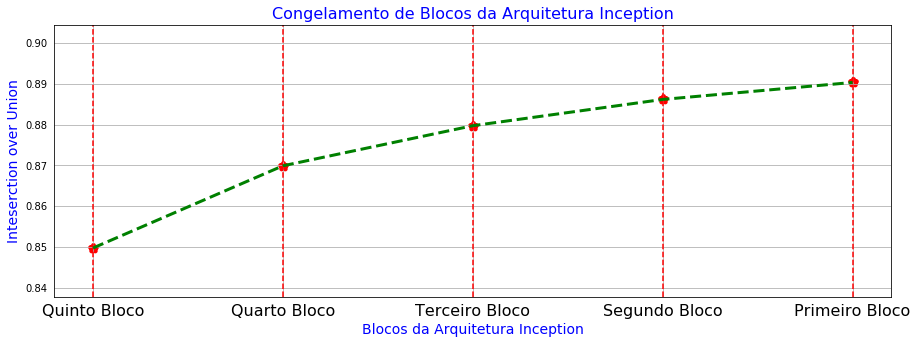

In [77]:
plt.figure(figsize = (15, 5))
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.scatter(x_labels, np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')
for line in range(0, 5):
  plt.axvline(line, color = 'red', linestyle = '--')
plt.plot(x_labels, np.array(iou_mean_list), linestyle = '--', color = 'green', linewidth = 3)
plt.xticks(size = 16, color = 'black')
plt.yticks(color = 'black')
plt.title('Congelamento de Blocos da Arquitetura Inception', size = 16, color = 'blue')
plt.xlabel('Blocos da Arquitetura Inception', size = 14, color = 'blue')
plt.ylabel('Inteserction over Union', size = 14, color = 'blue')
plt.grid(True)

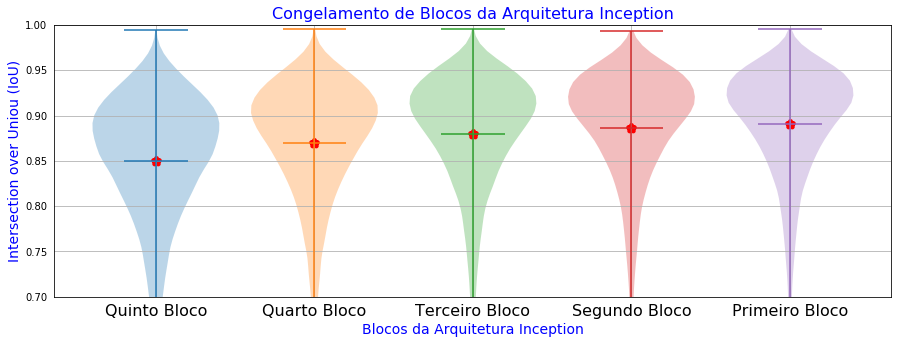

In [78]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura Inception', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura Inception', size = 16, color = 'blue')
plt.scatter([1, 2, 3, 4, 5], np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')

Text(0.5, 1.0, 'Congelamento de Blocos da Arquitetura Inception')

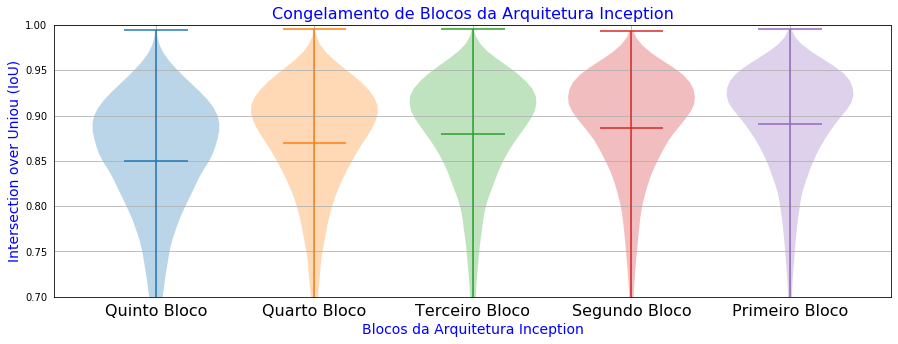

In [79]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura Inception', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura Inception', size = 16, color = 'blue')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

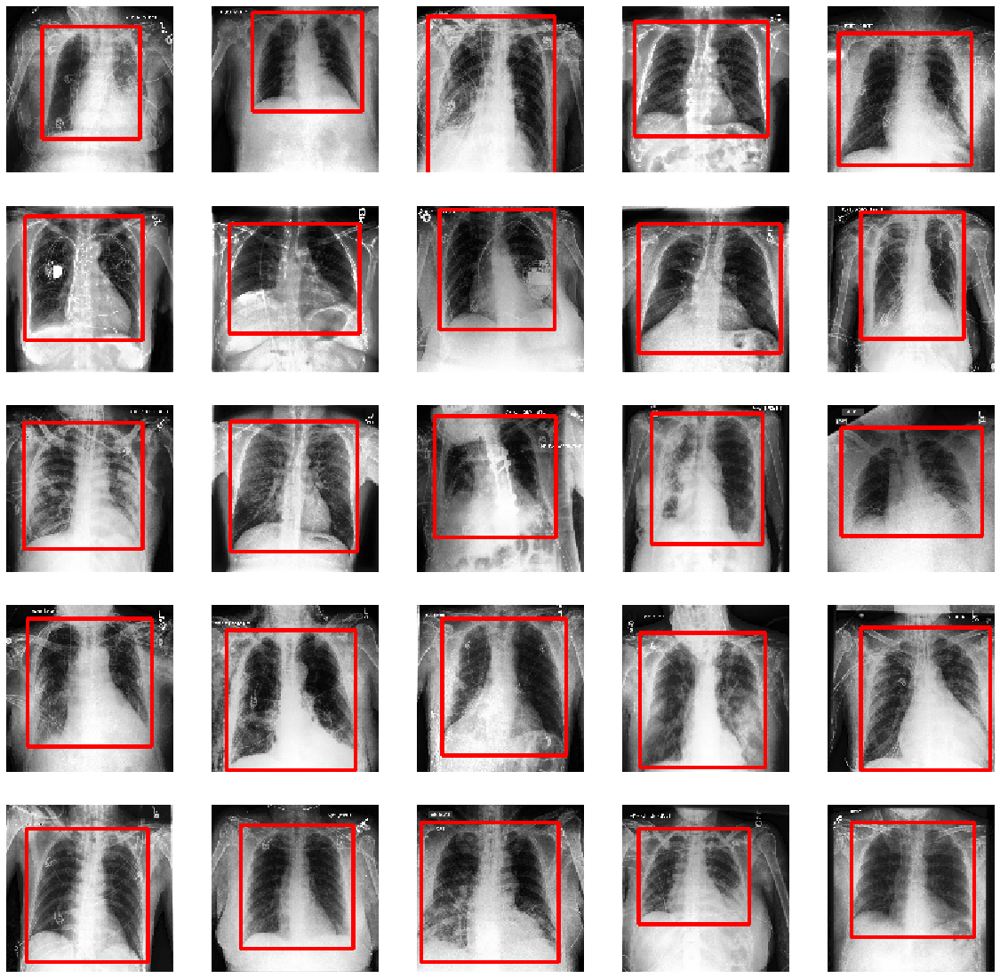

In [80]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

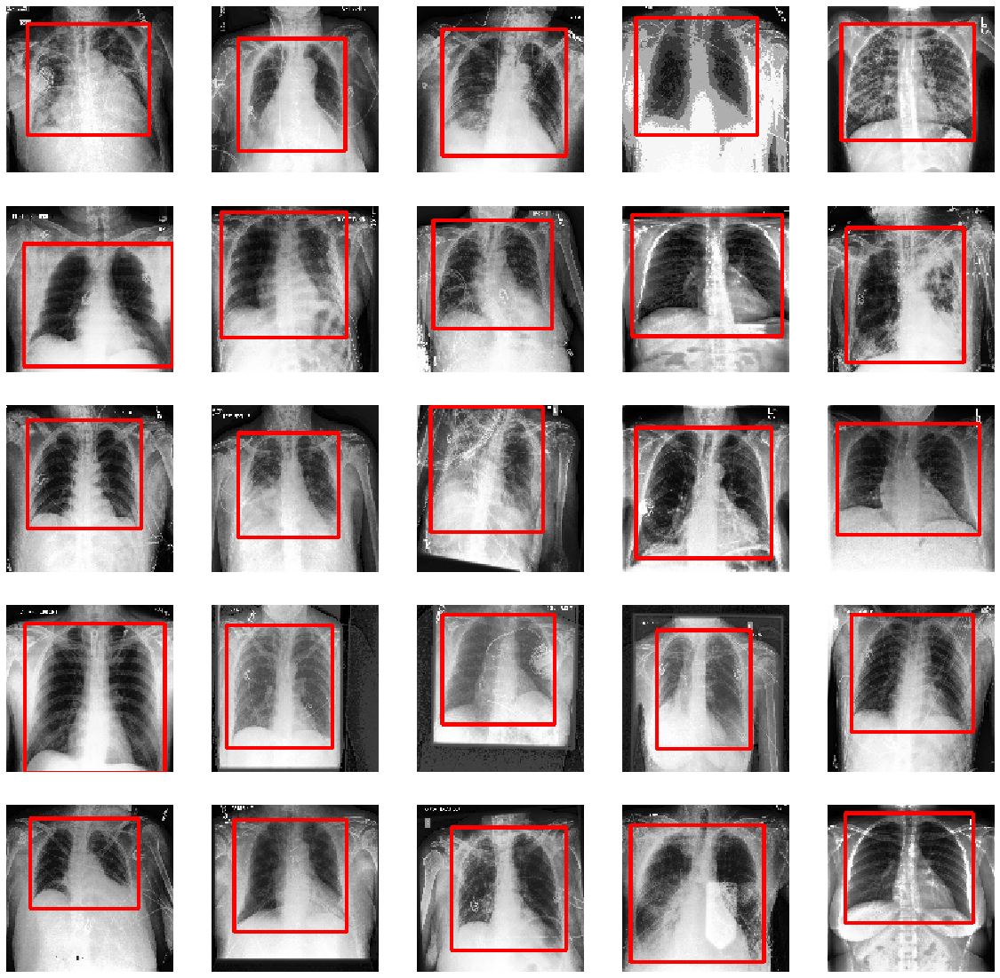

In [81]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

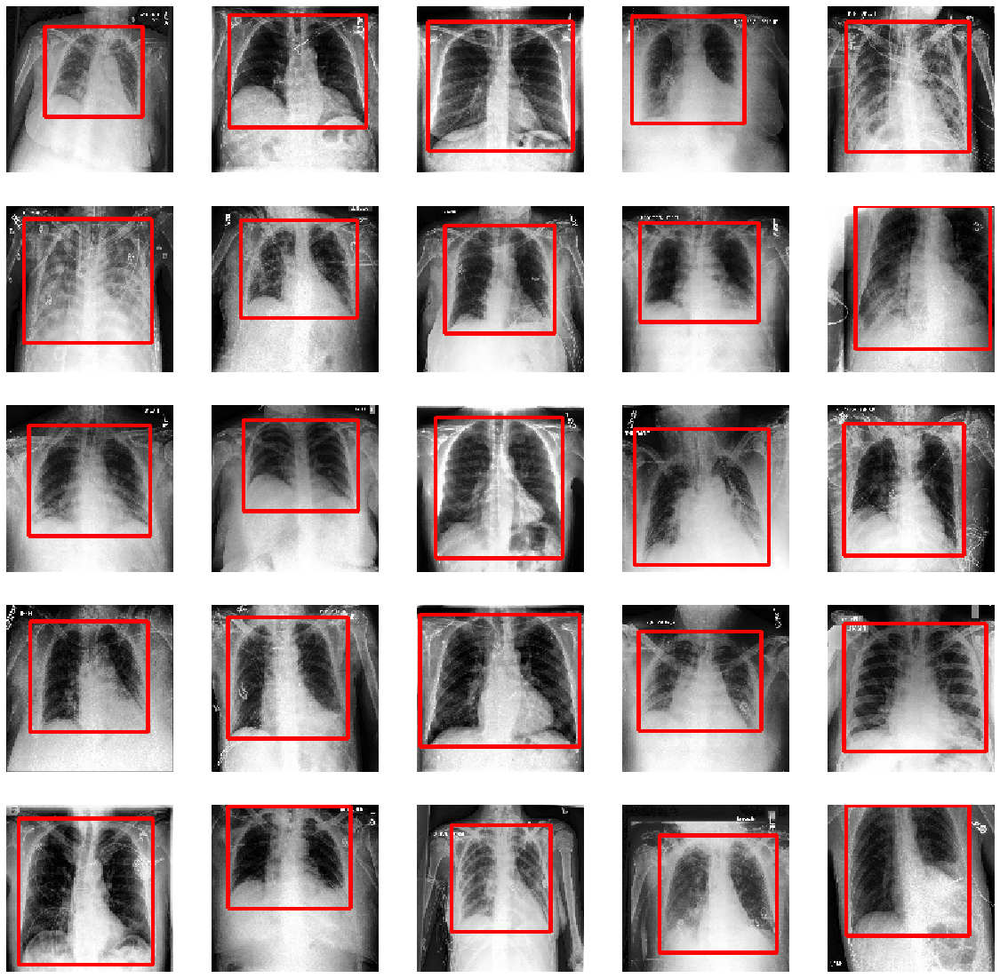

In [82]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

## 9. Comparison of Methods
***

In [83]:
plot_df = pd.read_csv('/content/plot-data-chexpert.csv', delimiter = ',', 
                      usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

plot_generator = data_gen.flow_from_dataframe(dataframe = plot_df, directory = '', x_col = 'Path',
                                              y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                              target_size = (128, 128), color_mode = 'rgb', batch_size = 50,
                                              class_mode = 'raw', shuffle = False, seed = 42)

plot_x, plot_y = plot_generator[0]
plot_files = list(plot_df['Path'])

Found 50 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

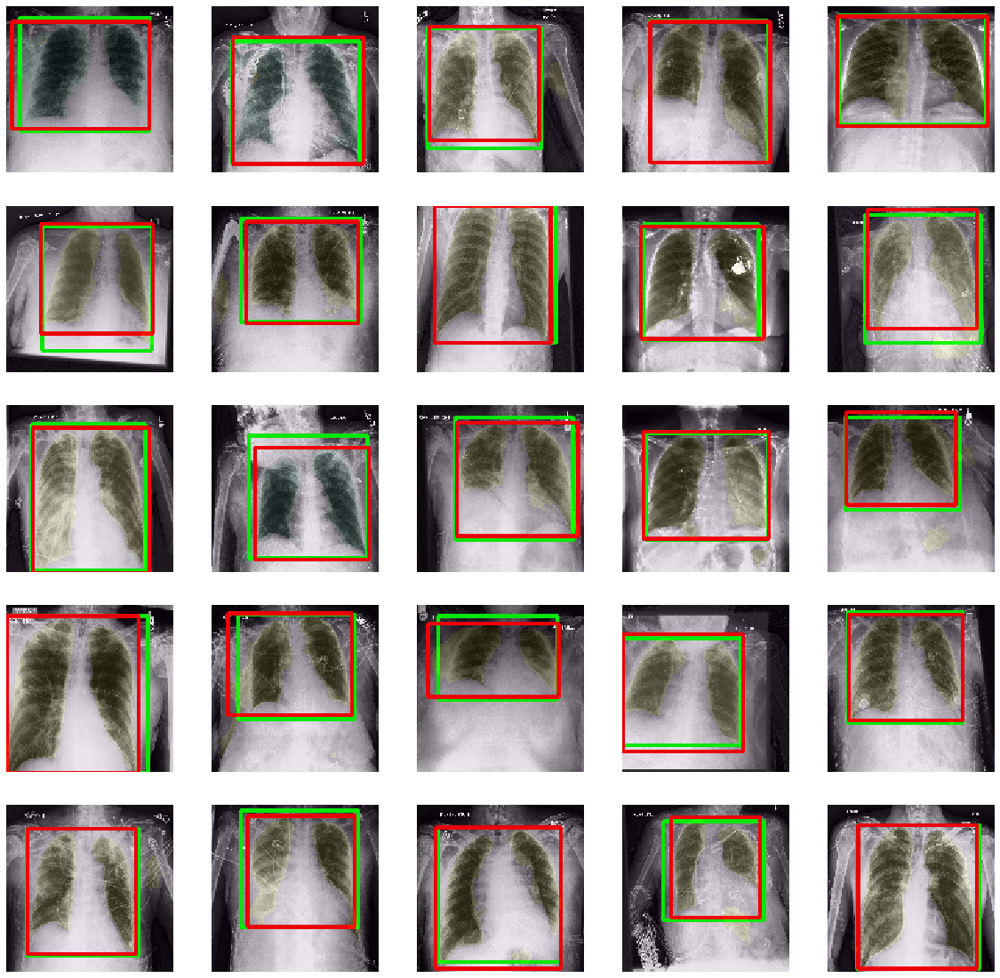

In [84]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

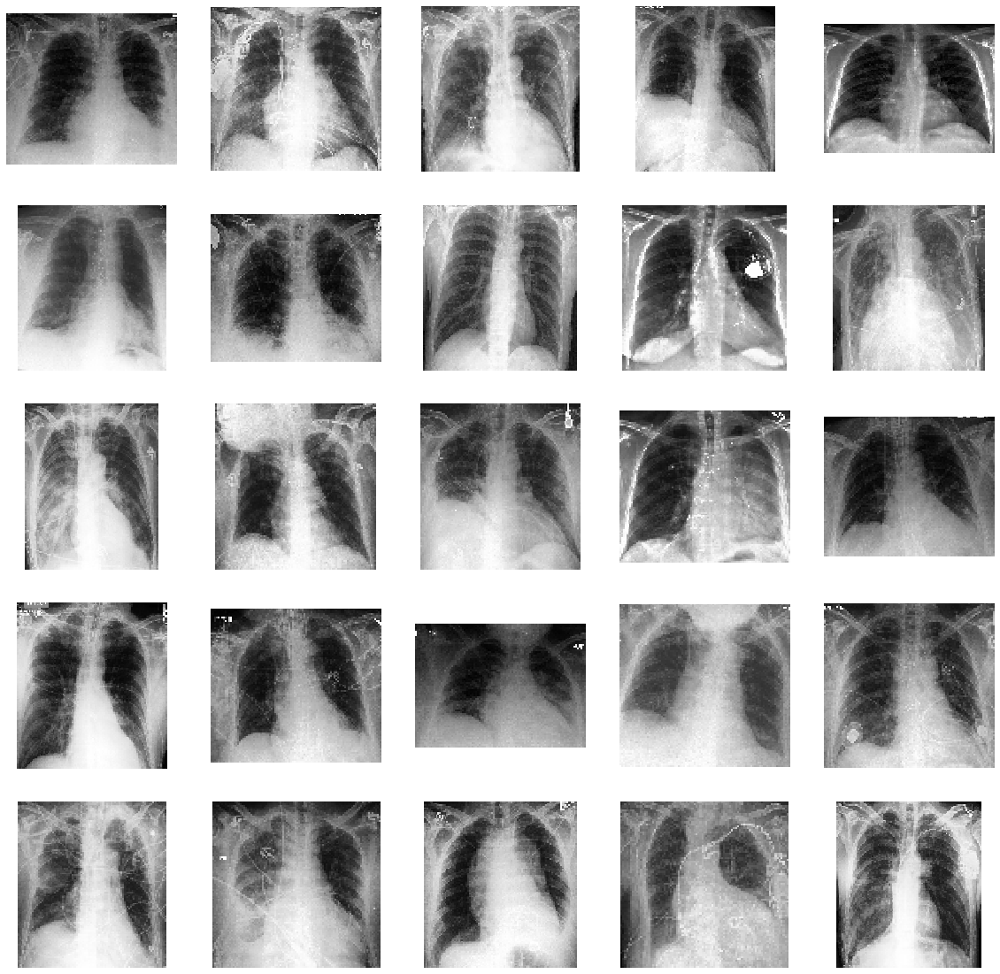

In [85]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

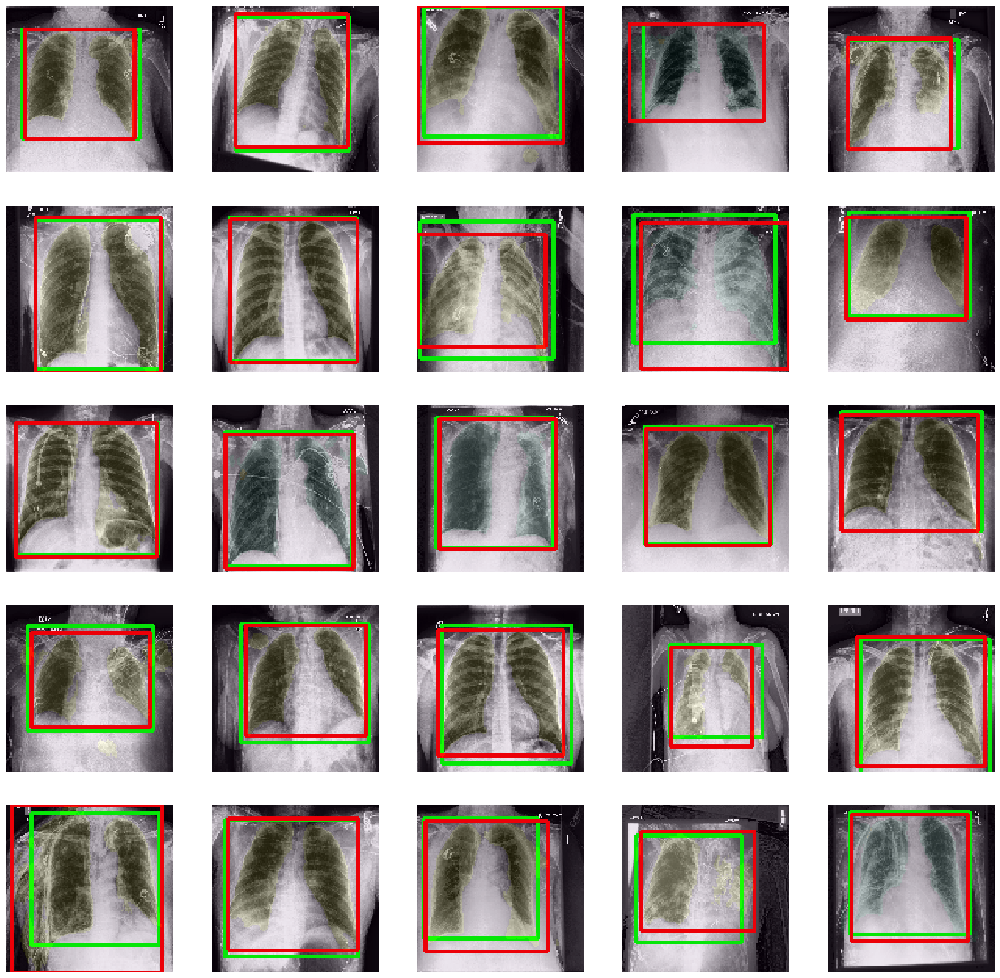

In [86]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

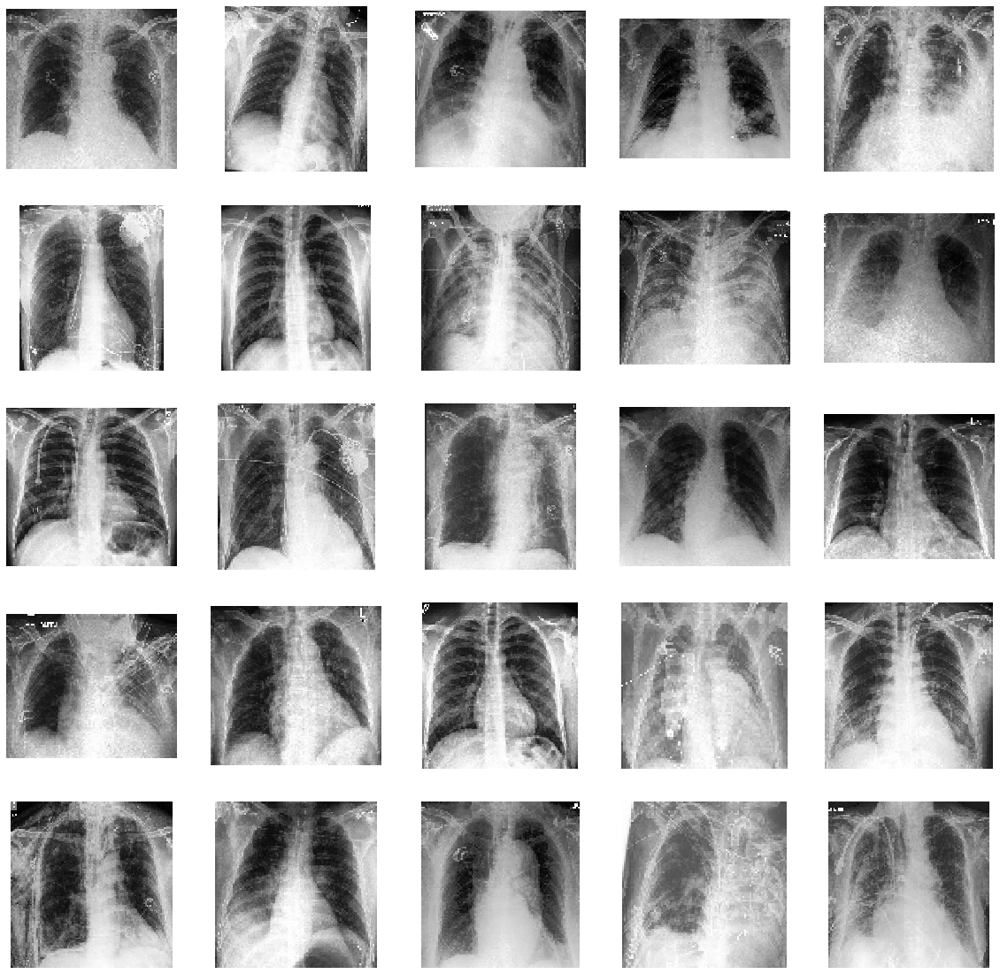

In [87]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 10. Testing in another database
***

In [ ]:
!cp -r /content/gdrive/MyDrive/montglomery-shenzhen-datasets.zip /content/
!unzip /content/montglomery-shenzhen-datasets.zip
!rm /content/montglomery-shenzhen-datasets.zip

In [11]:
filelist_montgomery = glob.glob('/content/Montgomery/MontgomerySet/CXR_png/*.png')
filelist_shenzen = glob.glob('/content/ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/*.png')

print('Number of Images from Montgomery Dataset:', len(filelist_montgomery), 'imagens')
print('Number of Images from Shenzhen Dataset:', len(filelist_shenzen), 'imagens')

montgomery_df = pd.DataFrame(filelist_montgomery, columns = ['Path'])
montgomery_df['Labels'] = np.zeros((len(filelist_montgomery, )))
shenzen_df = pd.DataFrame(filelist_shenzen, columns = ['Path'])
shenzen_df['Labels'] = np.zeros((len(filelist_shenzen, )))

Number of Images from Montgomery Dataset: 138 imagens
Number of Images from Shenzhen Dataset: 662 imagens


In [13]:
montgomery_generator = data_gen.flow_from_dataframe(dataframe = montgomery_df, directory = '', x_col = 'Path',
                                                    y_col = ['Labels'], target_size = (128, 128), 
                                                    color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                    shuffle = False, seed = 42)

shenzen_generator = data_gen.flow_from_dataframe(dataframe = shenzen_df, directory = '', x_col = 'Path',
                                                 y_col = ['Labels'], target_size = (128, 128), 
                                                 color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                 shuffle = False, seed = 42)

for i in range(0, len(montgomery_generator)):
  x, y = montgomery_generator[i]
  if i == 0:
    images_mont, labels_mont = x, y
  else:
    images_mont, labels_mont = np.concatenate((images_mont, x)), np.concatenate((labels_mont, y))

for i in range(0, len(shenzen_generator)):
  x, y = shenzen_generator[i]
  if i == 0:
    images_shen, labels_shen = x, y
  else:
    images_shen, labels_shen = np.concatenate((images_shen, x)), np.concatenate((labels_shen, y))

Found 138 validated image filenames.
Found 662 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

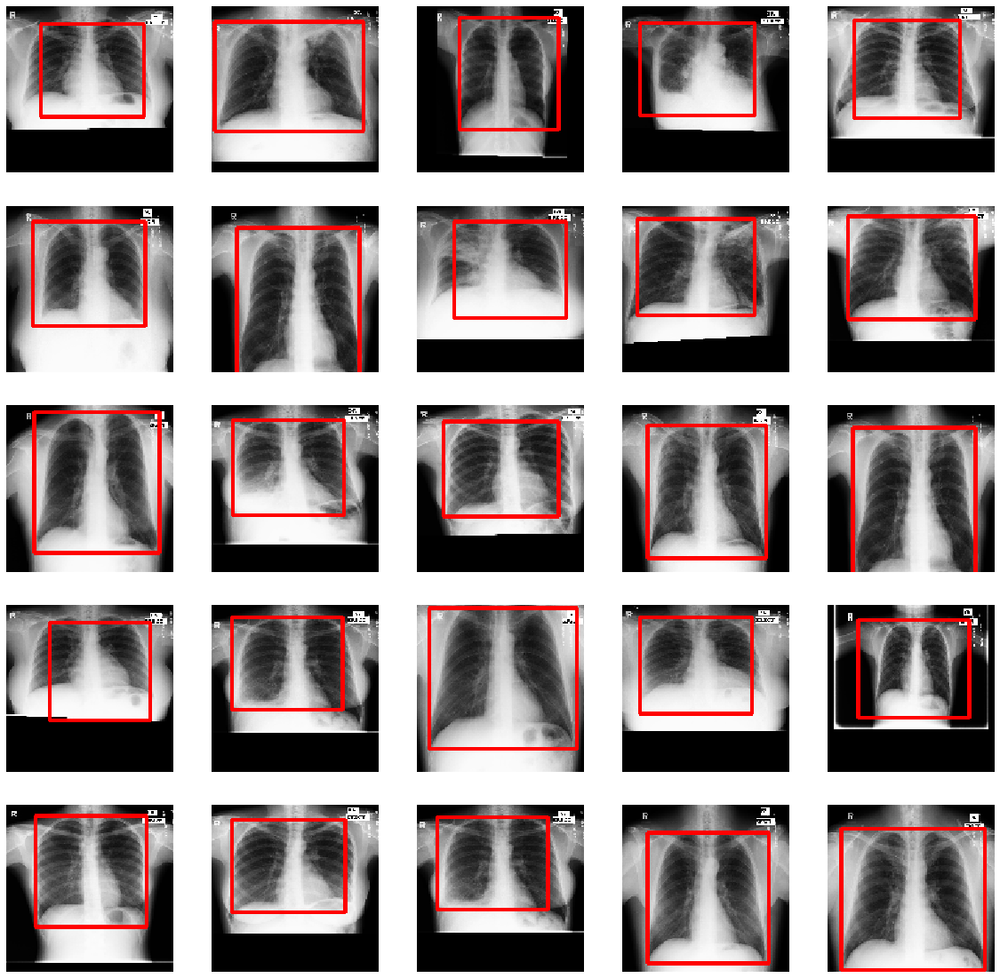

In [89]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

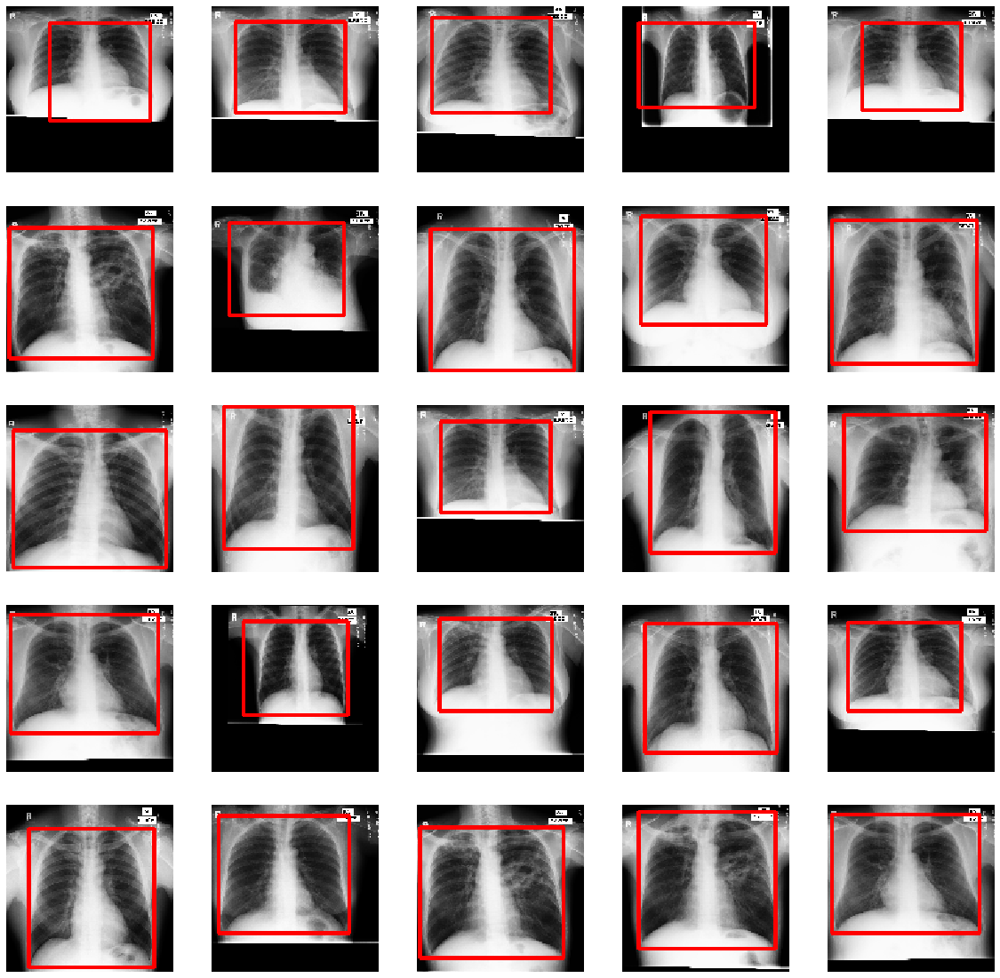

In [91]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

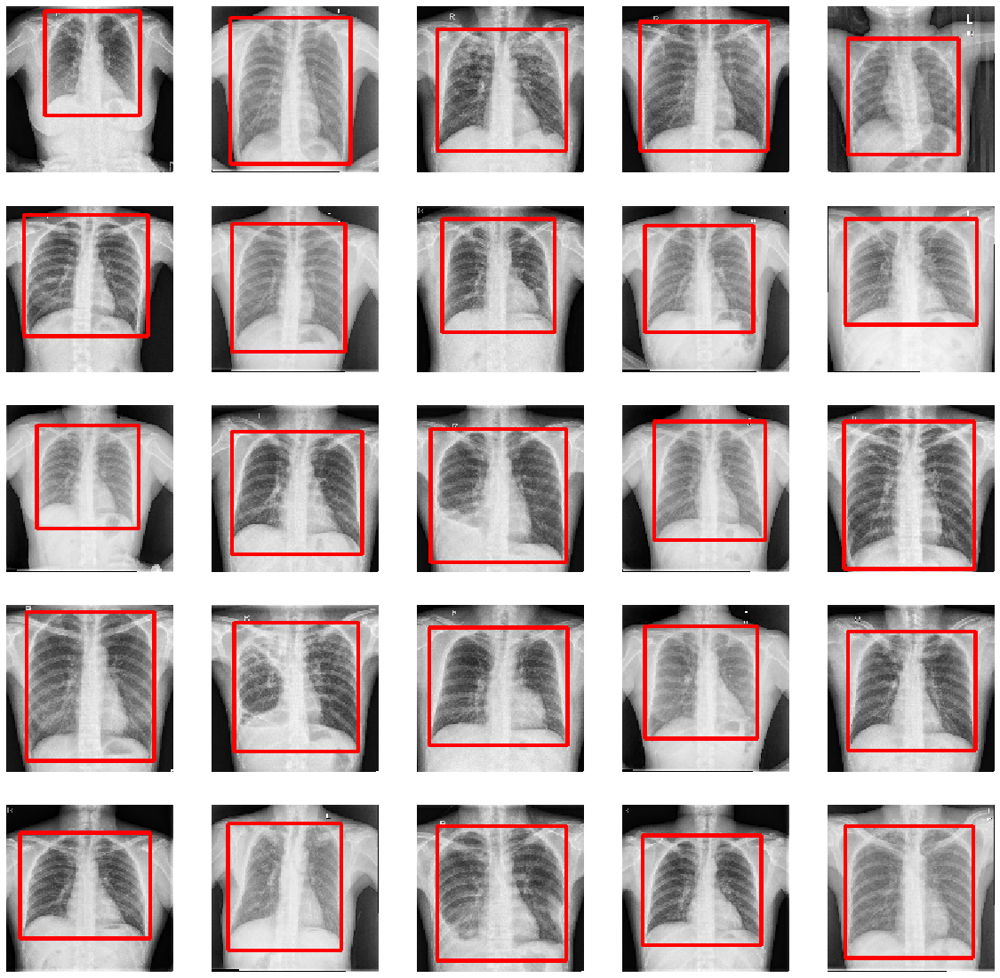

In [92]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

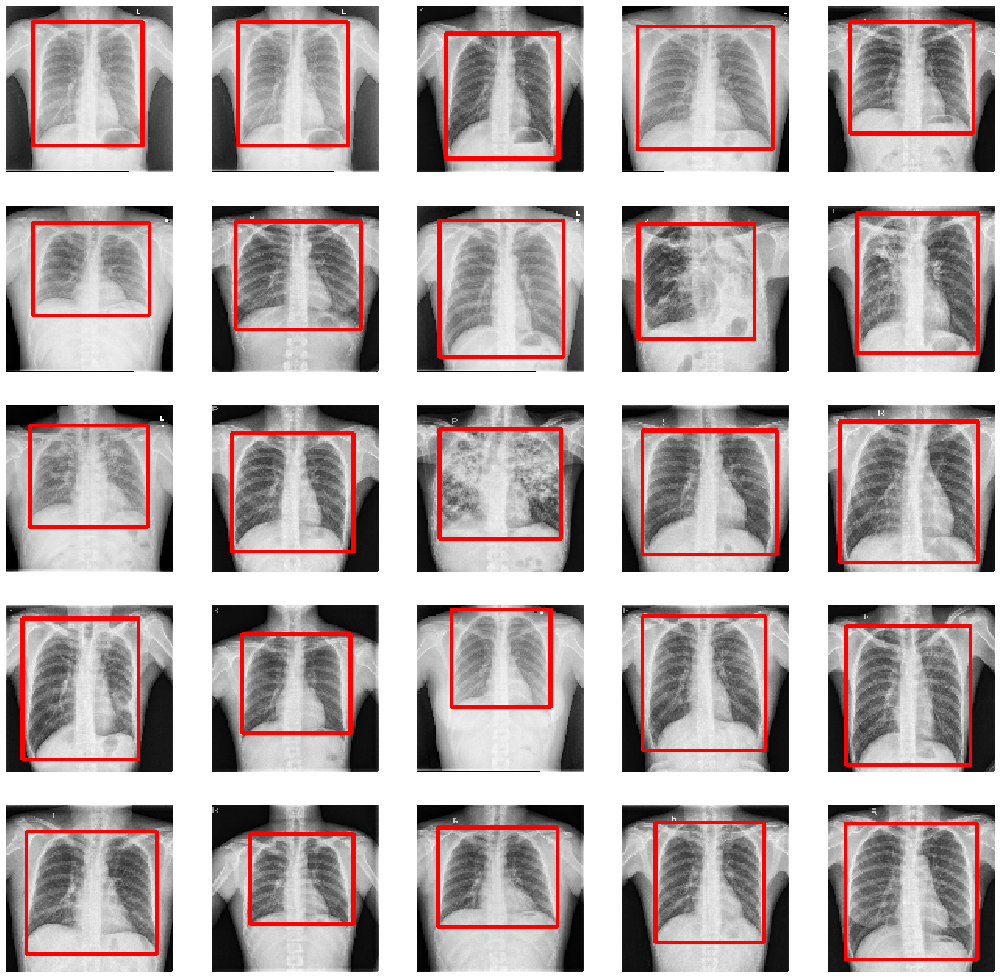

In [93]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

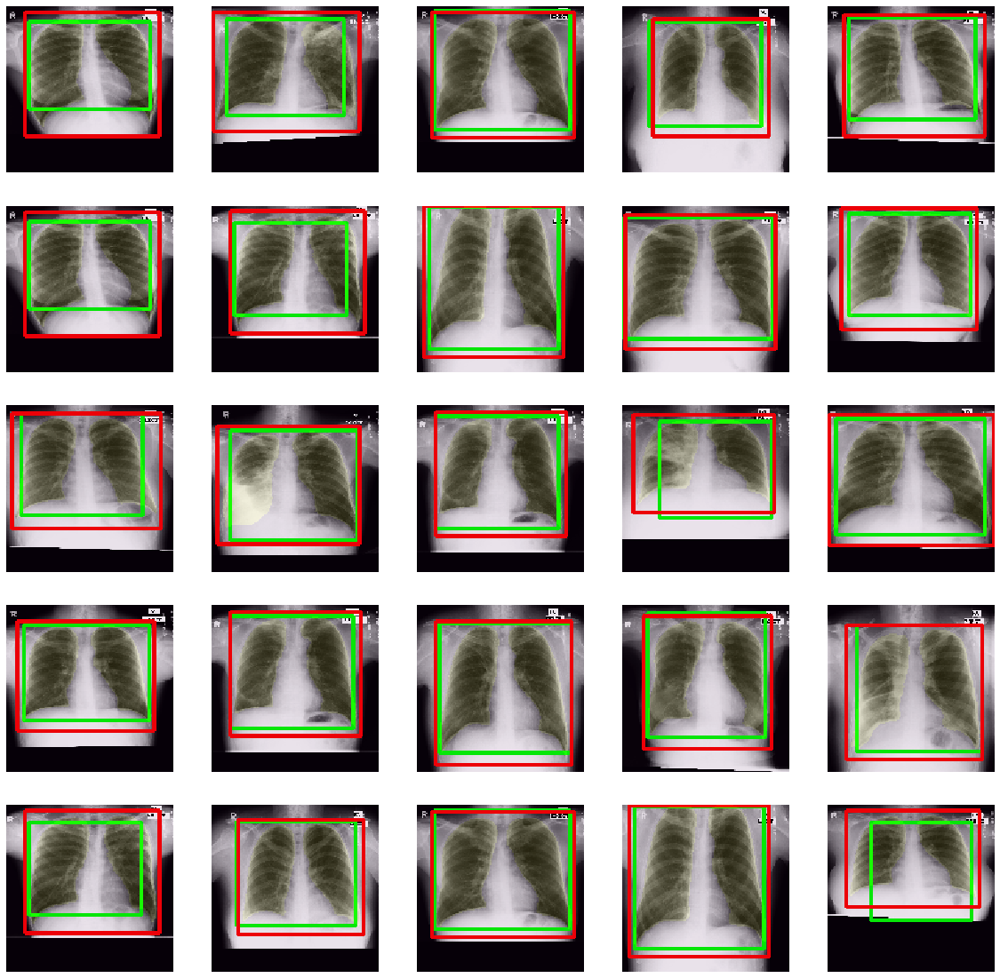

In [97]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_montgomery))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_montgomery[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_mont[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

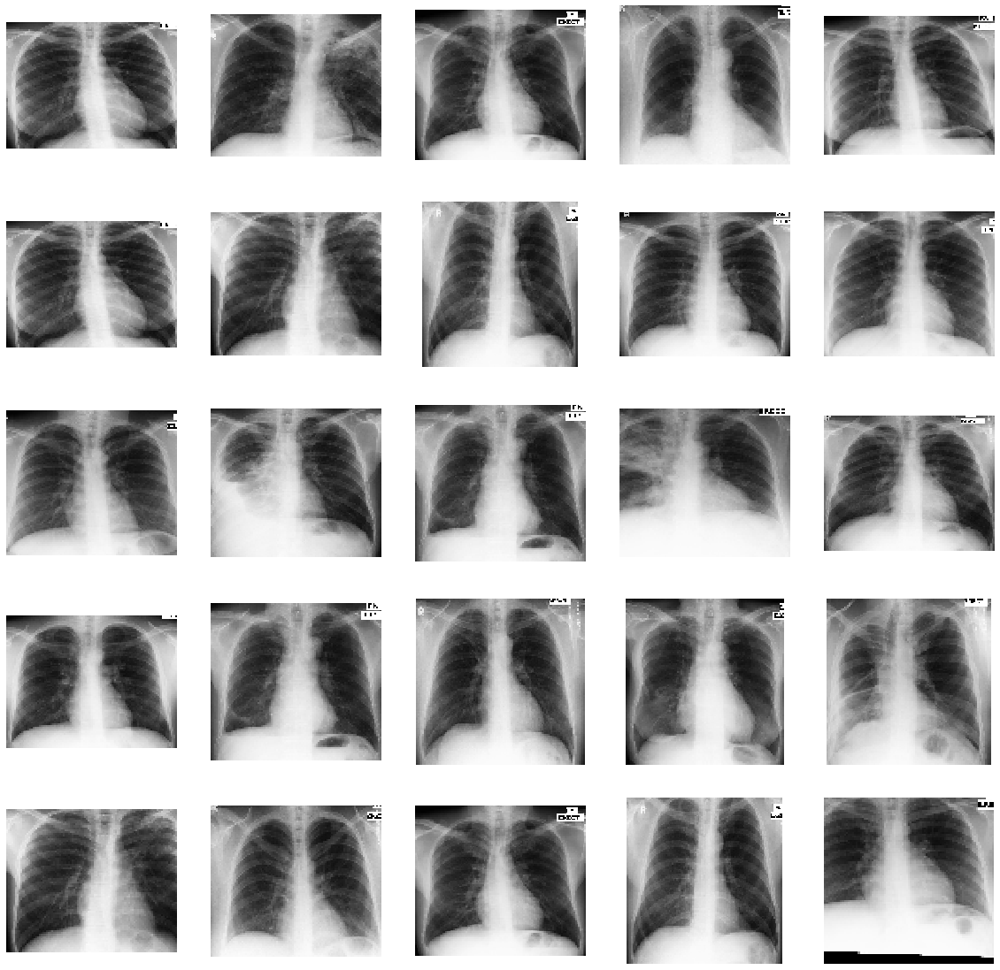

In [98]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_mont[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_mont[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

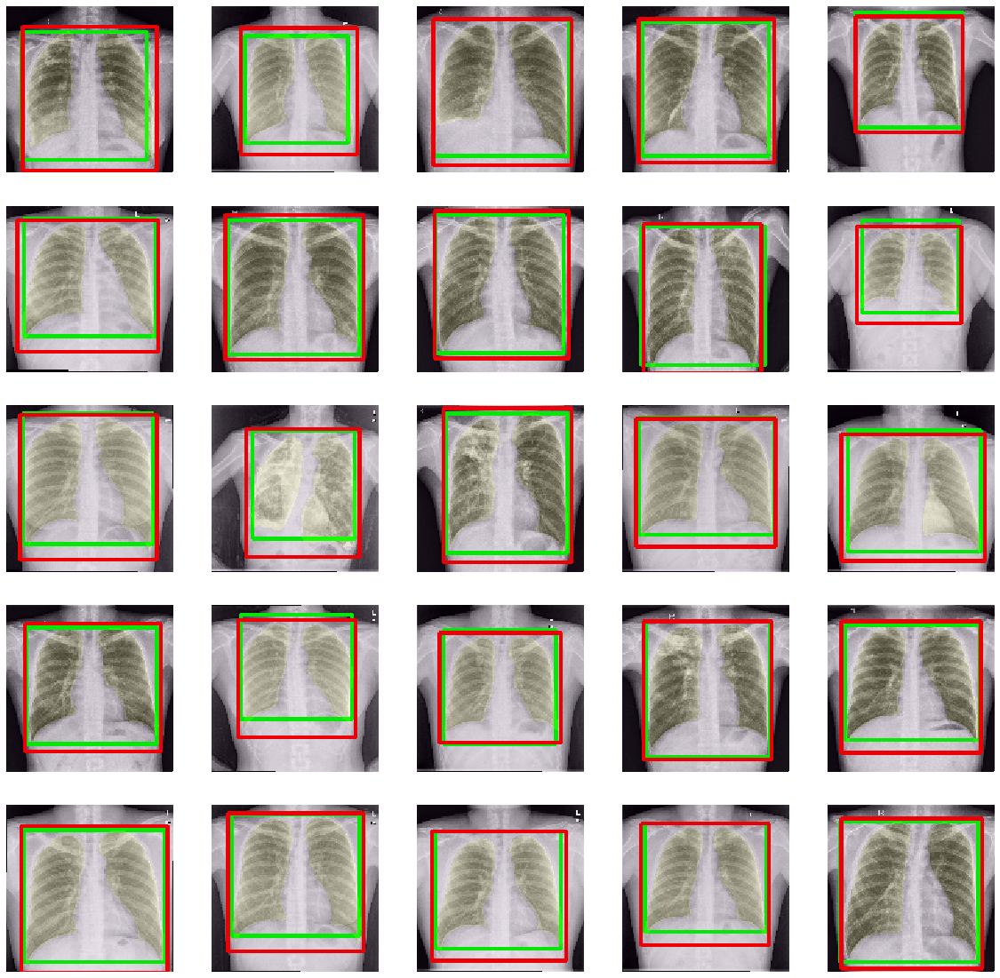

In [99]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_shenzen))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_shenzen[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_shen[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

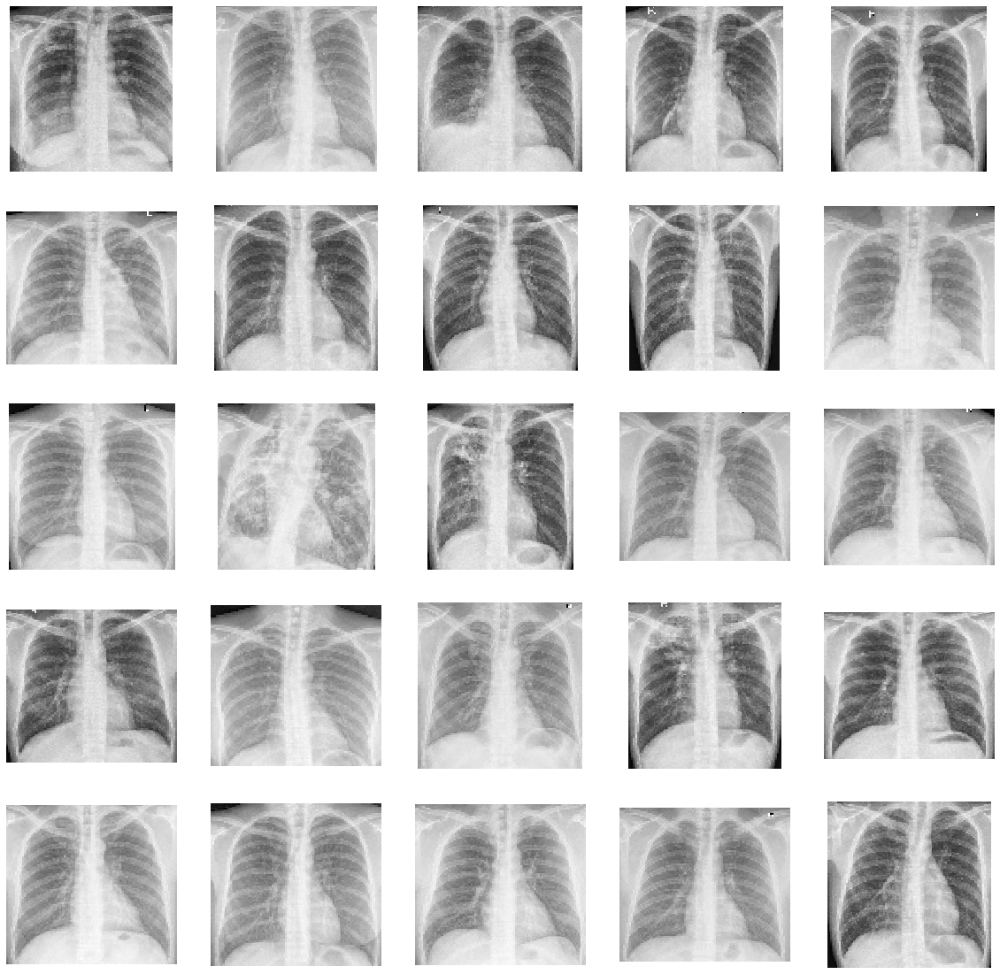

In [100]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_shen[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_shen[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 11. Comparação de Tempo de Inferência
***

In [101]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  list_coordinates = bbox_utils().extract_coordinates(mask = original_mask)
  coordinates_list.append(list_coordinates)
end_time = time.time()

print('Pulmonary Segmentation')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation
Runtime: 29.457 milliseconds


In [102]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  contours = bbox_utils().get_contours(mask = original_mask.copy())
  mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours =contours), 
                                             image_shape = img.shape)
  list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
  coordinates_list.append(list_coordinates)

end_time = time.time()

print('Pulmonary Segmentation + Image Processing')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation + Image Processing
Runtime: 48.832 milliseconds


In [103]:
start_time = time.time()
for image in plot_files:
  coordinates_list  = model.predict(plot_x)
end_time = time.time()

print('Convolutional Neural Networks')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Convolutional Neural Networks
Runtime: 1.771 milliseconds


|**Method**|**Inference Time (milliseconds)**|
|:-|:-:|
|Pulmonary Segmentation|29.457|
|Pulmonary Segmentation + Image Processing|48.832|
|Convolutional Neural Networks|1.771|